<h1>Preparacion de Datos Proyecto 2</h1>
<h2>Grupo 5</h2>


<h3>Limpieza y preparacion de los datos</h3>

<h4>Descripción de los datos</h4>

* Análisis de los datos: contienen XXXX registros y XXX variables diferentes.

* Variables y tipos de datos: contiene XXX variables de las cuales XXX de ellas son numéricas. 

* XX son variables categóricas. 

* Variables Numéricas:

A continuación se ve información relevante sobre las variables numéricas:

XX se encuentra entre XX y XX, con una desviación estándar que sugiere una alta variabilidad de los datos (XX aproximadamente). 



<h4>Exploración de los datos:</h4>

Outliers: se presentan outliers en XXXX con respecto al diccionario de datos
    

<h4>Calidad de los datos:</h4>

Datos Duplicados: Se identificaron XX datos duplicados en el conjunto de datos.

Datos incompletos o vacíos: Se encontraron datos vacíos en las variables:

Datos categóricos en variables numéricas: Evento es un dato categórico que está representado con variable numérica. Debido a que de este dato no se conoce lo que representa o un rango de valores esperado se planea su eliminación ya que al momento de interpretar la información del modelo no se tendrá claro su significado. 

Problemas de validez de datos: 

<h4>Entendimiento de datos:</h4>

Datos duplicados: Se eliminan los datos duplicados

Datos incompletos o vacíos: 


Se eliminan los valores atípicos ya que pueden afectar negativamente al modelo.

Finalmente, el conjunto de datos posee XXXX registros y XXX variables

<h4> 0. Carga de librerías necesarias para implementación y carga de datos</h4>

In [1]:
import os

import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

import ydata_profiling as pp

from sklearn.cluster import AgglomerativeClustering

import seaborn as sns; sns.set()  # for plot styling

from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_samples, silhouette_score

from sklearn.preprocessing import MinMaxScaler

from sklearn import metrics

from sklearn.impute import SimpleImputer

from sklearn.preprocessing import LabelEncoder



from ydata_profiling import ProfileReport

from matplotlib import cm

import warnings
# Ignorar la advertencia RuntimeWarning
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", message="The figure layout has changed to tight", category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", message="The default value of `n_init` will change from 10 to 'auto' in 1.4.", category=FutureWarning)

In [2]:
# Se cargan los datos. 
df_tecnologia= pd.read_csv('data/Uso de tecnologías de la información, TIC (Capítulo I).csv',  sep=';',encoding="ISO-8859-1")
# se carga el diccionario
df_diccio = pd.read_excel('data/Diccionario_anonimizado_DANE_EM2021.xlsx')

<strong><h4>1. Entendimiento de los datos</h4></strong>

Para entender los datos se considera importante entender la cantidad de datos que se tiene, verificar cuantas columnas y filas tienen los datos proporcionados

In [4]:
df_dim = df_tecnologia.shape
print(">> El dataframe contiene {} columnas y {} filas\n".format(df_dim[1], df_dim[0]))
print(">> El dataframe se ve de la siguiente forma: ")
df_tecnologia.head()

>> El dataframe contiene 83 columnas y 278022 filas

>> El dataframe se ve de la siguiente forma: 


,DIRECTORIO,DIRECTORIO_HOG,DIRECTORIO_PER,SECUENCIA_P,ORDEN,NPCIP1,NPCIP2A,NPCIP2B,NPCIP2C,NPCIP2D,...,NPCIP17E,NPCIP17F,NPCIP17G,NPCIP17H,NPCIP17I,NPCIP17J,NPCIP17K,NPCIP17L,NPCIP17M,FEX_C
0,166238.0,1662381,16623811,1,1,5,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"1,69849246231156"
1,166238.0,1662381,16623812,1,2,5,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,"1,69849246231156"
2,220102.0,2201021,22010211,1,1,5,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,"6,74441212899351"
3,220102.0,2201021,22010212,1,2,5,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"6,74441212899351"
4,220102.0,2201021,22010213,1,3,5,NaN,NaN,NaN,NaN,...,NaN,1.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,"6,74441212899351"


In [5]:

pd.set_option('display.max_colwidth', None)
df_diccio.rename(columns={'ï»¿Variable name': 'Column'}, inplace=True)
print(">> El diccionario de datos es el siguiente: ")
df_diccio[['NOMBRE COLUMNA', 'TEXTO_PREGUNTA']]

>> El diccionario de datos es el siguiente: 


,NOMBRE COLUMNA,TEXTO_PREGUNTA
0,DIRECTORIO,Identificador numérico de vivienda
1,DPTO,1. Departamento
2,MPIO,2. Municipio
3,CLASE,clase
4,COD_LOCALIDAD,Código de la localidad
...,...,...
1588,NHCMP12AUA24,12.2.25.25 Insumos para actividades agrícolas del hogar. Solo Bogotá rural y municipios ¿En cuánto estima el valor obtenido
1589,NHCMP12AUB24_1,12.2.25. ¿Cómo lo obtuvieron? 1 Tomado de un negocio del hogar\nInsumos para actividades agrícolas del hogar. Solo Bogotá rural y municipios
1590,NHCMP12AUB24_2,12.2.25 ¿Cómo lo obtuvieron? 2 Recibido como pago por trabajo\nInsumos para actividades agrícolas del hogar. Solo Bogotá rural y municipios
1591,NHCMP12AUB24_3,12.2.25 ¿Cómo lo obtuvieron? 3 Regalado\nInsumos para actividades agrícolas del hogar. Solo Bogotá rural y municipios


<h5>1.1. Entendimiento de contenido</h5>

Se visualizan las variables para identificar tendencias, correlaciones y posibles valores atípicos que pueden afectar nuestro proceso de análisis y toma de decisiones. 

>> Se visualizan los datos en conjunto: 


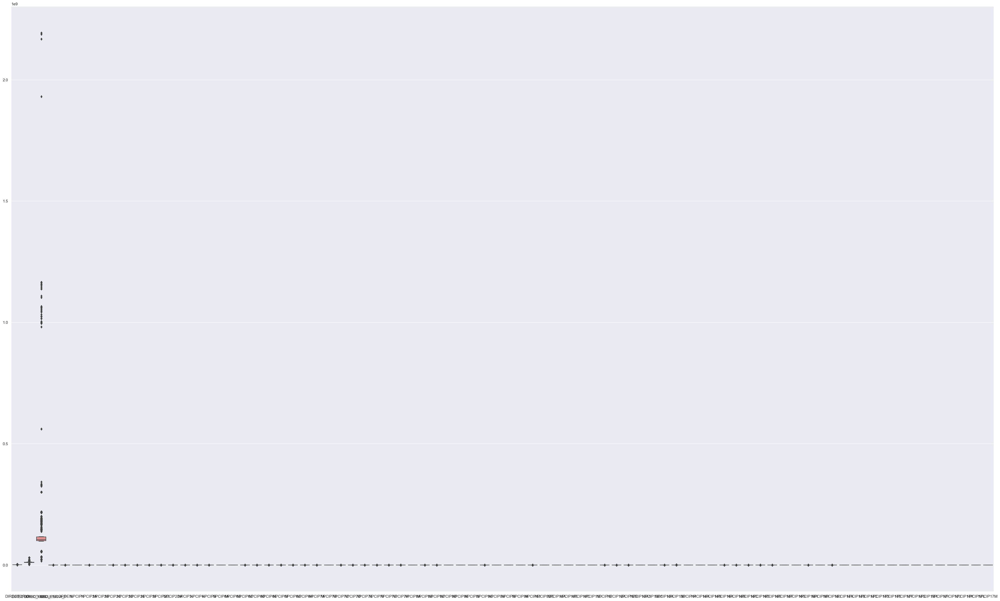

In [6]:
# Visualización de todas las variables
fig = plt.figure(figsize=(50, 30))
ax = sns.boxplot(data=df_tecnologia, orient="v")
print(">> Se visualizan los datos en conjunto: ")
plt.show()

Ya que se tienen escalas significativamente diferentes, se procede a normalizar los datos, para que que cada columna contribuya de manera igual al análisis y evitar cualquier sesgo causado por las diferencias en las escalas.

Para normalizar los datos, utilizaremos la técnica de escala Min-Max, que transforma cada valor en una columna a un valor entre 0 y 10 basado en los valores mínimo y máximo en esa columna.

Una vez que los datos estén normalizados, podemos proceder con el entendimiento de los datos al poder observarlos mejor.


<h5>1.2. Calidad de datos</h5>

En esta sección se identifican los datos que son incorrectos.

In [7]:
print(">> Se puede observar la información detallada de cada columna:\n")
df_tecnologia.info()

>> Se puede observar la información detallada de cada columna:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278022 entries, 0 to 278021
Data columns (total 83 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DIRECTORIO      278022 non-null  float64
 1   DIRECTORIO_HOG  278022 non-null  int64  
 2   DIRECTORIO_PER  278022 non-null  int64  
 3   SECUENCIA_P     278022 non-null  int64  
 4   ORDEN           278022 non-null  int64  
 5   NPCIP1          278022 non-null  int64  
 6   NPCIP2A         147224 non-null  float64
 7   NPCIP2B         147224 non-null  float64
 8   NPCIP2C         147224 non-null  float64
 9   NPCIP2D         147224 non-null  float64
 10  NPCIP2E         147224 non-null  float64
 11  NPCIP2F         147224 non-null  float64
 12  NPCIP2G         147224 non-null  float64
 13  NPCIP2DA        1796 non-null    float64
 14  NPCIP3          147224 non-null  float64
 15  NPCIP4          278022 non-null  int64

In [11]:
#non_numeric_balance = df_plantas[pd.to_numeric(df_plantas['Luz'], errors='coerce').isnull()]
#print(">> A continuación se muestran los datos no numéricos de la columna:\n")
#print(non_numeric_balance[['No', 'Microbio']])


<h5>Análisis de completitud, unicidad y validez</h5>

In [9]:
pd.set_option('display.max_rows', None)

# Calcula los porcentajes de valores nulos en cada columna y muéstralos
print(">> Los porcentajes de valores nulos en cada columna son los siguientes: ")
print((df_tecnologia.isnull().sum() / len(df_tecnologia) * 100).sort_values(ascending=False))


>> Los porcentajes de valores nulos en cada columna son los siguientes: 
NPCIP14A          99.766925
NPCIP17M          99.374150
NPCIP2DA          99.354008
NPCIP17L          98.020660
NPCIP11C          95.824431
NPCIP17B          95.575530
NPCIP14B          92.695902
NPCIP11D          92.695542
NPCIP17H          90.485285
NPCIP17K          88.020013
NPCIP14           86.182029
NPCIP5            84.177511
NPCIP17J          75.245484
NPCIP17F          67.356180
NPCIP17G          67.151161
NPCIP13B1         65.712426
NPCIP13B          65.712426
NPCIP11B          57.651912
NPCIP11A          52.562027
NPCIP17D          51.588004
NPCIP8DE          51.018984
NPCIP17I          50.495644
NPCIP13A          47.960233
NPCIP13A1         47.960233
NPCIP2A           47.045917
NPCIP2G           47.045917
NPCIP2B           47.045917
NPCIP2F           47.045917
NPCIP2D           47.045917
NPCIP2E           47.045917
NPCIP3            47.045917
NPCIP2C           47.045917
NPCIP17E          45.219083
NPC

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

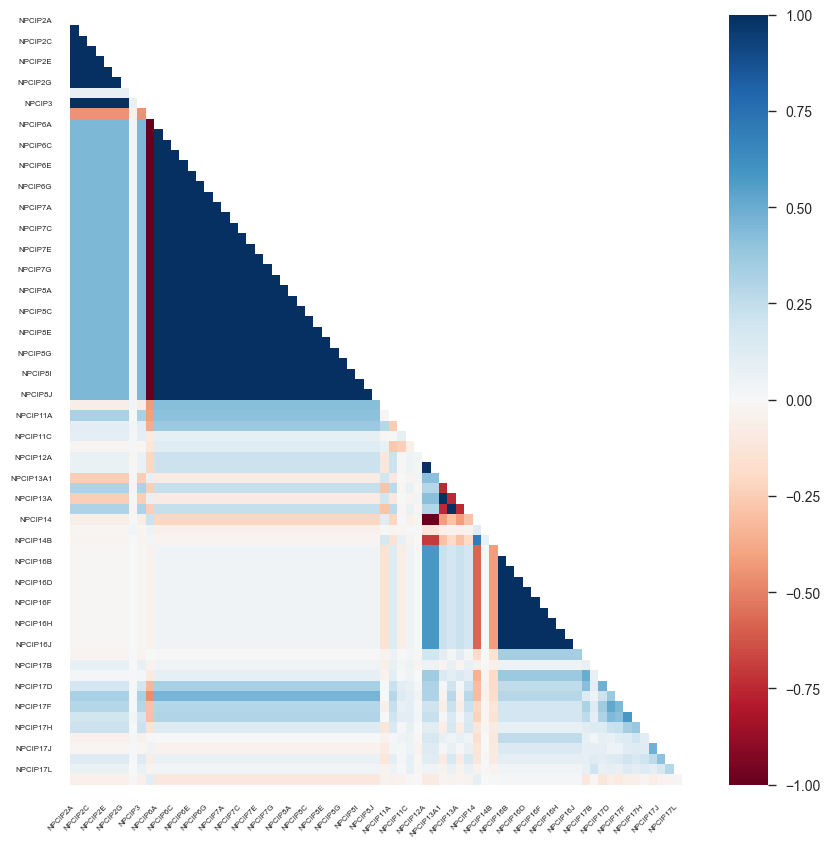

In [10]:
profile = ProfileReport(df_tecnologia, title="Reporte de uso de tecnologías")
profile.to_notebook_iframe()
profile.to_file("UsoTecnologia.html")